# -PROYECTO MACHINE LEARNING-
- ### <a id='0'>**1. SIKERBET®**</a>

## **Índice**
---
1. [Introducción](#1)
2. [Objetivo](#2)
3. [Tratamiento de datos](#)
    1. [Fuentes](#)
    2. [Librerias](#41)
    3. [Importación de los datos](#)
    4. [Depuración de los datos](#)
    6. [Feature engineering](#)
    7. [DataFrame final](#)
4. [EDA](#)
    1. [Análisis univariante](#)
        1. [Categorico](#)
        2. [Numérico](#)
5. [Preparacion model](#)
    1. [Target](#)
6. [Baseline](#)
7. [Crossvalidation](#)
8. [GridSearch](#)
9. [Modelo final](#)
10. [Conclusiones](#6)
    1. [Resumen](#)

---
#### Contacto:
* Perfil personal en LinkedIn: [LinkedIn](https://www.linkedin.com/in/ivancorderoc/)

* Para dudas y consultas: [ivan.corderocueva@gmail.com](mailto:ivan.corderocueva@gmail.com)

* Mi baúl con todos mis proyectos: [GitHub](https://github.com/ivancorderoc)

---

# 1. Introducción

 - Proyecto de Machine Learning para predicciones de la NFL. 

 - Aquí, realizaremos un pequeño Análisis Exploratorio de Datos (EDA) sin entrar en análisi estadístico y construiremos un baseline con los mejores modelos disponibles. Luego, seleccionaremos el mejor modelo mediante Feature Importances y GridSearch para lograr predicciones precisas.

# 2. Objetivo

- El objetivo es generar un modelo de alta precisión que nos ayude a predecir resultados de partidos de la NFL(victoria local o victoria visitante).Nuestra métrica será la precision.

# 3. Tratamiento de datos

### 3.1 Fuentes
- Datasets: ***"NFL scores and betting data"***: [NFL – Kaggle]("https://www.kaggle.com/datasets/tobycrabtree/nfl-scores-and-betting-data")

### 3.2 Librerías

In [1]:
from utils.libreries import *

### 3.3 Importanción datos

In [2]:
file_path = "data/raw/spreadspoke_scores.csv"

#Hacemos la llamada a nuestro DF
scores = pd.read_csv(file_path)
scores.head(5)

,schedule_date,schedule_season,schedule_week,schedule_playoff,team_home,score_home,score_away,team_away,team_favorite_id,spread_favorite,over_under_line,stadium,stadium_neutral,weather_temperature,weather_wind_mph,weather_humidity,weather_detail
0,9/2/1966,1966,1,False,Miami Dolphins,14,23,Oakland Raiders,NaN,NaN,NaN,Orange Bowl,False,83.0,6.0,71.0,NaN
1,9/3/1966,1966,1,False,Houston Oilers,45,7,Denver Broncos,NaN,NaN,NaN,Rice Stadium,False,81.0,7.0,70.0,NaN
2,9/4/1966,1966,1,False,San Diego Chargers,27,7,Buffalo Bills,NaN,NaN,NaN,Balboa Stadium,False,70.0,7.0,82.0,NaN
3,9/9/1966,1966,2,False,Miami Dolphins,14,19,New York Jets,NaN,NaN,NaN,Orange Bowl,False,82.0,11.0,78.0,NaN
4,9/10/1966,1966,1,False,Green Bay Packers,24,3,Baltimore Colts,NaN,NaN,NaN,Lambeau Field,False,64.0,8.0,62.0,NaN


In [3]:
scores.describe().T

,count,mean,std,min,25%,50%,75%,max
schedule_season,13516.0,1996.082939,16.144258,1966.0,1983.0,1997.0,2010.0,2022.0
score_home,13516.0,22.461897,10.526423,0.0,15.0,22.0,29.0,72.0
score_away,13516.0,19.784848,10.165222,0.0,13.0,20.0,27.0,62.0
spread_favorite,11037.0,-5.385204,3.439617,-26.5,-7.0,-4.5,-3.0,0.0
weather_temperature,12309.0,58.833211,15.538656,-6.0,48.0,62.0,72.0,97.0
weather_wind_mph,12293.0,7.689010,5.694124,0.0,3.0,8.0,11.0,40.0
weather_humidity,8468.0,67.212801,15.796414,4.0,57.0,69.0,79.0,100.0


In [4]:
scores.isnull().sum()

schedule_date              0
schedule_season            0
schedule_week              0
schedule_playoff           0
team_home                  0
score_home                 0
score_away                 0
team_away                  0
team_favorite_id        2479
spread_favorite         2479
over_under_line         2489
stadium                    0
stadium_neutral            0
weather_temperature     1207
weather_wind_mph        1223
weather_humidity        5048
weather_detail         10597
dtype: int64

In [5]:
scores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13516 entries, 0 to 13515
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   schedule_date        13516 non-null  object 
 1   schedule_season      13516 non-null  int64  
 2   schedule_week        13516 non-null  object 
 3   schedule_playoff     13516 non-null  bool   
 4   team_home            13516 non-null  object 
 5   score_home           13516 non-null  int64  
 6   score_away           13516 non-null  int64  
 7   team_away            13516 non-null  object 
 8   team_favorite_id     11037 non-null  object 
 9   spread_favorite      11037 non-null  float64
 10  over_under_line      11027 non-null  object 
 11  stadium              13516 non-null  object 
 12  stadium_neutral      13516 non-null  bool   
 13  weather_temperature  12309 non-null  float64
 14  weather_wind_mph     12293 non-null  float64
 15  weather_humidity     8468 non-null  

#### Descripción de las columnas del dataset

- `schedule_date`: La fecha en la que se llevó a cabo el juego.
- `schedule_season`: La temporada en la que se llevó a cabo el juego.
- `schedule_week`: La semana dentro de la temporada en la que se llevó a cabo el juego.
- `schedule_playoff`: Indicador booleano que muestra si el juego fue parte de los playoffs (1: Sí, 0: No).
- `team_home`: El equipo local (equipo que juega en su estadio) en el juego.
- `score_home`: La puntuación obtenida por el equipo local.
- `score_away`: La puntuación obtenida por el equipo visitante.
- `team_away`: El equipo visitante (equipo que juega fuera de su estadio) en el juego.
- `team_favorite_id`: El identificador del equipo favorito según las apuestas.
- `spread_favorite`: La diferencia de puntos en la que el equipo favorito es favorecido en las apuestas.
- `over_under_line`: La línea de apuestas sobre el total de puntos esperados en el juego.
- `stadium`: El nombre del estadio donde se llevó a cabo el juego.
- `stadium_neutral`: Indicador booleano que muestra si el estadio fue neutral (1: Sí, 0: No).
- `weather_temperature`: La temperatura durante el juego.
- `weather_wind_mph`: La velocidad del viento durante el juego en millas por hora.
- `weather_humidity`: La humedad durante el juego.
- `weather_detail`: Detalles adicionales sobre las condiciones climáticas durante el juego.

Las columnas describen detalles sobre los juegos de fútbol americano, incluyendo información sobre las fechas, equipos, puntuaciones, apuestas, estadios y condiciones climáticas. Estas descripciones deberían ayudarte a entender mejor el contenido y significado de cada columna en el dataset.


### 3.4 Depuración de los datos

- Después de cargar nuestros datos en crudo procedemos a trabajar sobre ellos.

In [6]:
#Nos quedamos solo con la temporada regular. Procedemos a eliminar los playoffs
scores = scores[scores['schedule_playoff'] == 0]
scores = scores.loc[scores['schedule_season'] >= 1980]

In [7]:
#Cambiamos el formato de las columnas para que sean numéricas
scores = scores.astype({'schedule_playoff': int,
                        'schedule_week': int,
                        'over_under_line': float
                        })

In [8]:
#Eliminamos los NANs de las columnas debido su antiguedad y que pueden ser irrelevantes
scores.isnull().sum()

schedule_date             0
schedule_season           0
schedule_week             0
schedule_playoff          0
team_home                 0
score_home                0
score_away                0
team_away                 0
team_favorite_id          0
spread_favorite           0
over_under_line           0
stadium                   0
stadium_neutral           0
weather_temperature     692
weather_wind_mph        691
weather_humidity       4188
weather_detail         7690
dtype: int64

In [9]:
# Eliminamos las columnas que no nos interesan debido a alto numero de NANs "weather_detail", "weather_humidity"
# Eliminamos la columna "schedule_playoff" que no nos interesa 

scores = scores.drop(columns=["schedule_playoff","weather_detail", "stadium_neutral",])

In [10]:
#Tratamos los Nans de nuestras columnas. Para la columna "weather_temperature" utizamos media al ser simitrica su distrubucion.
# Para la columna "weather_humidity" la media debido a que tiende a ser una distrubucion logaritmica.
scores = scores.fillna({'weather_temperature': scores['weather_temperature'].median(),
                        'weather_wind_mph': (scores['weather_wind_mph'].median())})


In [11]:
# Reseteamos nuestro dataset
scores = scores.reset_index(drop=True)

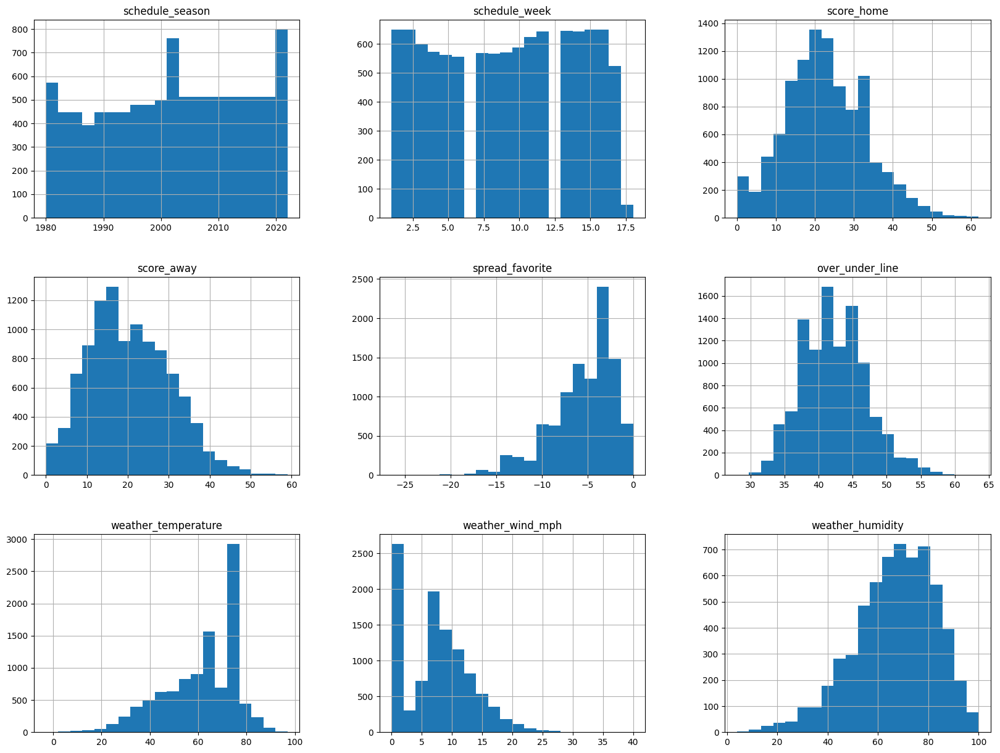

In [12]:
#Pre-features
scores.hist(bins=20, figsize=(20,15));

### 3.5 Feature engineering

In [13]:
# Calcula la diferencia de puntajes entre el equipo local y visitante
scores['score_diff'] = scores['score_home'] - scores['score_away']

In [14]:
# Creamos una nueva columna con el total de puntos
scores['total_points'] = scores['score_home'] + scores['score_away']

In [15]:
#creamos nuestro target
scores["result"] = (scores["score_home"] >= scores["score_away"]).astype(int)

In [16]:
scores = scores.fillna(0)
scores['weather_humidity'] = pd.to_numeric(scores['weather_humidity'])

In [17]:
#cambiamos el foromato de nuestas columnas
scores = scores.astype({
                        "team_home":"category",
                        "team_away":"category",
                        "team_favorite_id":"category",
                        "stadium":"category",
                        })

In [18]:
#Estandarizamos nombres de equipos
scores.team_home.replace({"Washington Redskins":"WAS",
                                 "Washington Football Team":"WAS",
                                 "Washington Commanders":"WAS",
                                 "San Diego Chargers":"LAC",
                                 "Los Angeles Chargers":"LAC",
                                 "Los Angeles Raiders":"LVR",
                                 "Las Vegas Raiders":"LVR",
                                 "Oakland Raiders":"LVR",
                                 "Tennessee Oilers":"TEN",
                                 "Houston Oilers": "TEN",
                                 "Tennessee Titans":"TEN",
                                 "Phoenix Cardinals":"LAR",
                                 "St. Louis Rams":"LAR",
                                 "Los Angeles Rams":"LAR",
                                 "St. Louis Cardinals": "ARI",
                                 "Arizona Cardinals":"ARI",
                                 "Baltimore Colts":"IND",
                                 "Indianapolis Colts":"IND",
                                 "Houston Texans":"HOU",
                                 "Baltimore Ravens":"BAL",
                                 "Carolina Panthers":"CAR",
                                 "Jacksonville Jaguars":"JAX",
                                 "Cleveland Browns":"CLE",
                                 "Cincinnati Bengals":"CIN",
                                 "Chicago Bears":"CHI",
                                 "Dallas Cowboys":"DAL",
                                 "Detroit Lions":"DET",
                                 "Green Bay Packers":"GB",
                                 "Kansas City Chiefs":"KC",
                                 "Miami Dolphins":"MIA",
                                 "Pittsburgh Steelers":"PIT",
                                 "Tampa Bay Buccaneers":"TB",
                                 "New York Jets":"NYJ",
                                 "Atlanta Falcons":"ATL",
                                 "New Orleans Saints":"NO",
                                 "New England Patriots":"NE",
                                 "Denver Broncos":"DEN",
                                 "San Francisco 49ers":"SF",
                                 "Seattle Seahawks":"SEA",
                                 "Buffalo Bills":"BUF",
                                 "New York Giants":"NYG",
                                 "Minnesota Vikings":"MIN",
                                 "Philadelphia Eagles":"PHI"}, inplace=True)

In [19]:
#Estandarizamos nombres de equipos
scores.team_away.replace({"Washington Redskins":"WAS",
                                 "Washington Football Team":"WAS",
                                 "Washington Commanders":"WAS",
                                 "San Diego Chargers":"LAC",
                                 "Los Angeles Chargers":"LAC",
                                 "Los Angeles Raiders":"LVR",
                                 "Las Vegas Raiders":"LVR",
                                 "Oakland Raiders":"LVR",
                                 "Tennessee Oilers":"TEN",
                                 "Houston Oilers": "TEN",
                                 "Tennessee Titans":"TEN",
                                 "Phoenix Cardinals":"LAR",
                                 "St. Louis Rams":"LAR",
                                 "Los Angeles Rams":"LAR",
                                 "St. Louis Cardinals": "ARI",
                                 "Arizona Cardinals":"ARI",
                                 "Baltimore Colts":"IND",
                                 "Indianapolis Colts":"IND",
                                 "Houston Texans":"HOU",
                                 "Baltimore Ravens":"BAL",
                                 "Carolina Panthers":"CAR",
                                 "Jacksonville Jaguars":"JAX",
                                 "Cleveland Browns":"CLE",
                                 "Cincinnati Bengals":"CIN",
                                 "Chicago Bears":"CHI",
                                 "Dallas Cowboys":"DAL",
                                 "Detroit Lions":"DET",
                                 "Green Bay Packers":"GB",
                                 "Kansas City Chiefs":"KC",
                                 "Miami Dolphins":"MIA",
                                 "Pittsburgh Steelers":"PIT",
                                 "Tampa Bay Buccaneers":"TB",
                                 "New York Jets":"NYJ",
                                 "Atlanta Falcons":"ATL",
                                 "New Orleans Saints":"NO",
                                 "New England Patriots":"NE",
                                 "Denver Broncos":"DEN",
                                 "San Francisco 49ers":"SF",
                                 "Seattle Seahawks":"SEA",
                                 "Buffalo Bills":"BUF",
                                 "New York Giants":"NYG",
                                 "Minnesota Vikings":"MIN",
                                 "Philadelphia Eagles":"PHI"}, inplace=True)

In [20]:
#instanciamos el encoder
encoder = LabelEncoder()

# Aplica el label encoding a las tres columnas y crea nuevas columnas con los valores codificados
scores['team_home_encoded'] = encoder.fit_transform(scores['team_home'])
scores['team_away_encoded'] = encoder.fit_transform(scores['team_away'])
scores['team_favorite_id_encoded'] = encoder.fit_transform(scores['team_favorite_id'])


In [21]:
# #Guardamos el modelo para utilizarlo en el despligue y hacerlo más amigable para el cliente
# with open("encoder.pkl", "wb") as f:
#     pickle.dump(encoder, f)


### 3.5 Dataframe final

- Listos para poder empezar a trabajar con el dataset.

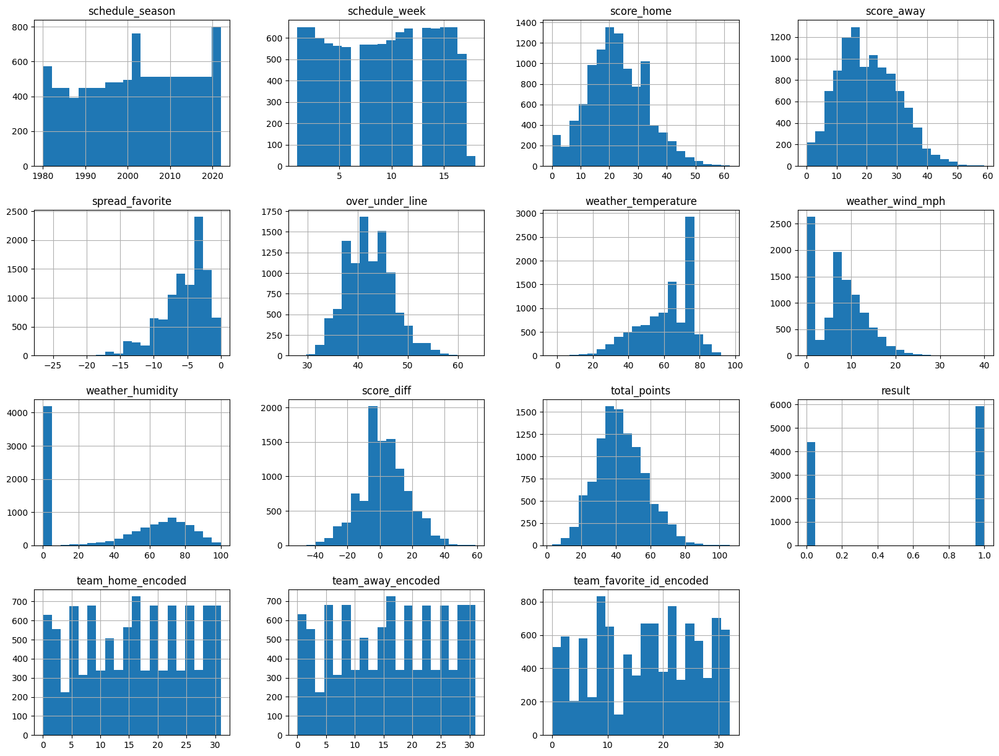

In [22]:
scores.hist(bins=20, figsize=(20,15));

# 4. EDA

### 4.1 Análisis univariante

In [23]:
scores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10317 entries, 0 to 10316
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   schedule_date             10317 non-null  object  
 1   schedule_season           10317 non-null  int64   
 2   schedule_week             10317 non-null  int64   
 3   team_home                 10317 non-null  category
 4   score_home                10317 non-null  int64   
 5   score_away                10317 non-null  int64   
 6   team_away                 10317 non-null  category
 7   team_favorite_id          10317 non-null  category
 8   spread_favorite           10317 non-null  float64 
 9   over_under_line           10317 non-null  float64 
 10  stadium                   10317 non-null  category
 11  weather_temperature       10317 non-null  float64 
 12  weather_wind_mph          10317 non-null  float64 
 13  weather_humidity          10317 non-null  floa

#### 4.1.1 Univariente ordenado

count    10317.000000
mean      2001.999612
std         12.246372
min       1980.000000
25%       1992.000000
50%       2002.000000
75%       2013.000000
max       2022.000000
Name: schedule_season, dtype: float64


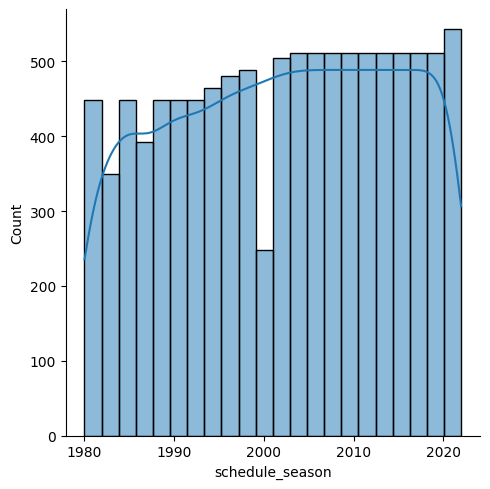

In [24]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["schedule_season"].describe())

#Visualizamos
sns.displot(data=scores, x="schedule_season", kde=True);

count    10317.000000
mean         9.078123
std          4.961631
min          1.000000
25%          5.000000
50%          9.000000
75%         13.000000
max         18.000000
Name: schedule_week, dtype: float64


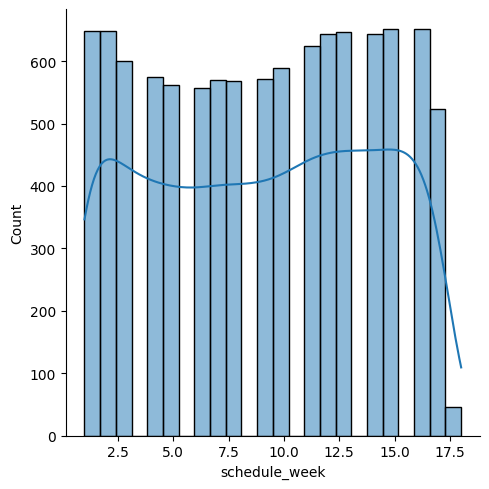

In [25]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["schedule_week"].describe())

#Visualizamos
sns.displot(data=scores, x="schedule_week", kde=True);

count    10317.000000
mean        22.646603
std         10.306280
min          0.000000
25%         16.000000
50%         22.000000
75%         30.000000
max         62.000000
Name: score_home, dtype: float64


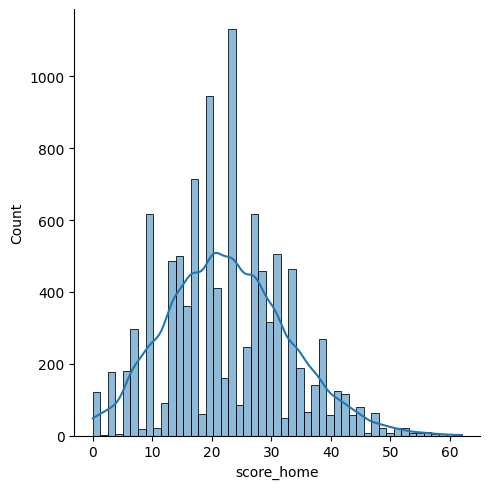

In [26]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["score_home"].describe())

#Visualizamos
sns.displot(data=scores, x="score_home", kde=True);

count    10317.000000
mean        20.181157
std         10.075598
min          0.000000
25%         13.000000
50%         20.000000
75%         27.000000
max         59.000000
Name: score_away, dtype: float64


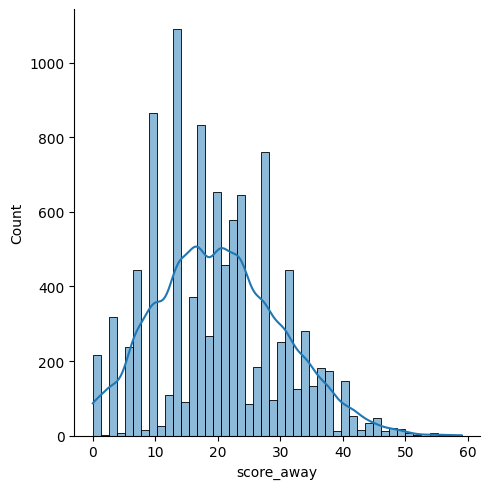

In [27]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["score_away"].describe())

#Visualizamos
sns.displot(data=scores, x="score_away", kde=True);

count    10317.000000
mean        -5.371571
std          3.449707
min        -26.500000
25%         -7.000000
50%         -4.500000
75%         -3.000000
max          0.000000
Name: spread_favorite, dtype: float64


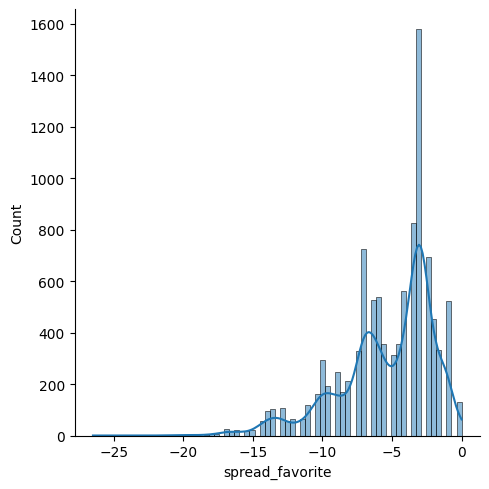

In [28]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["spread_favorite"].describe())

#Visualizamos
sns.displot(data=scores, x="spread_favorite", kde=True);

count    10317.000000
mean        42.277280
std          4.746622
min         28.000000
25%         39.000000
50%         42.000000
75%         45.000000
max         63.500000
Name: over_under_line, dtype: float64


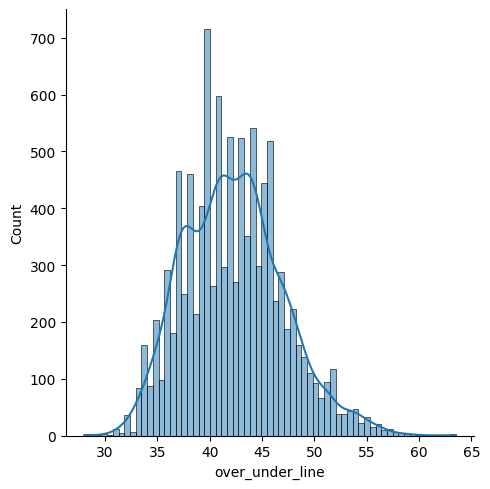

In [29]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["over_under_line"].describe())

#Visualizamos
sns.displot(data=scores, x="over_under_line", kde=True);

count    10317.000000
mean        60.353591
std         14.887344
min         -3.000000
25%         51.000000
50%         64.000000
75%         72.000000
max         97.000000
Name: weather_temperature, dtype: float64


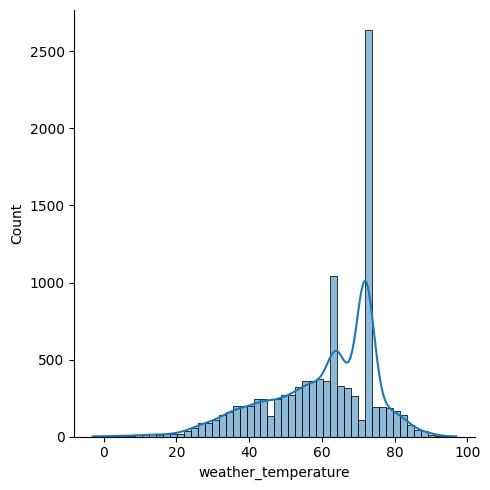

In [30]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["weather_temperature"].describe())

#Visualizamos
sns.displot(data=scores, x="weather_temperature", kde=True);

count    10317.000000
mean         7.127363
std          5.553824
min          0.000000
25%          1.000000
50%          7.000000
75%         11.000000
max         40.000000
Name: weather_wind_mph, dtype: float64


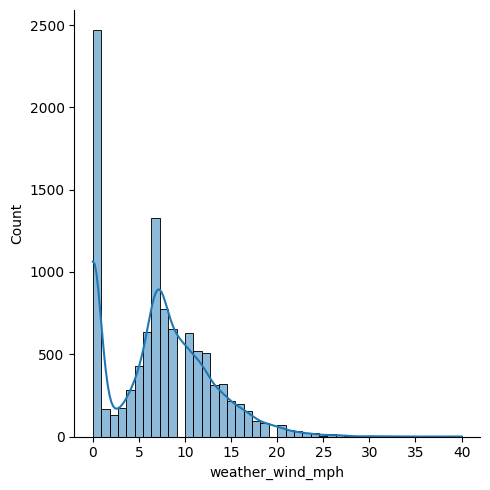

In [31]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["weather_wind_mph"].describe())

#Visualizamos
sns.displot(data=scores, x="weather_wind_mph", kde=True);

count    10317.000000
mean        39.556073
std         34.977299
min          0.000000
25%          0.000000
50%         50.000000
75%         72.000000
max        100.000000
Name: weather_humidity, dtype: float64


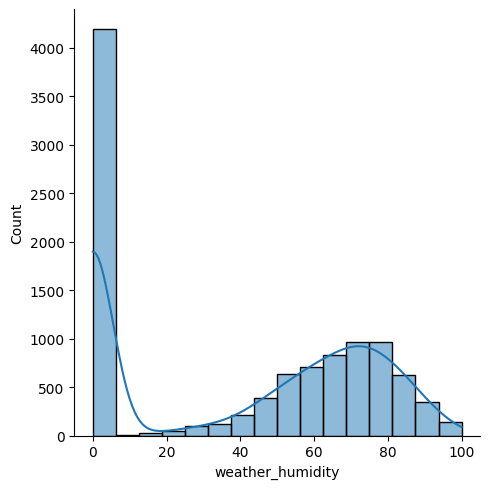

In [32]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["weather_humidity"].describe())

#Visualizamos
sns.displot(data=scores, x="weather_humidity", kde=True);

count    10317.000000
mean         2.465445
std         14.574590
min        -51.000000
25%         -6.000000
50%          3.000000
75%         11.000000
max         59.000000
Name: score_diff, dtype: float64


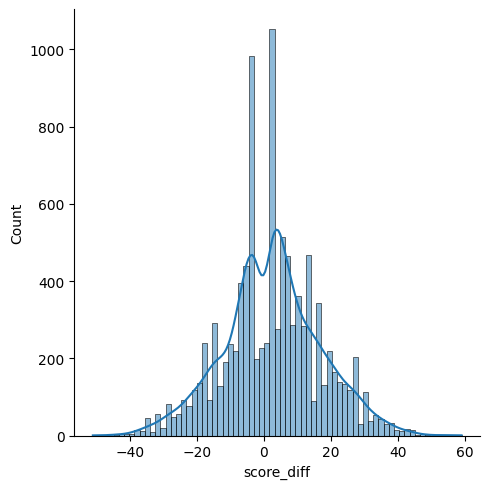

In [33]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["score_diff"].describe())

#Visualizamos
sns.displot(data=scores, x="score_diff", kde=True);

count    10317.000000
mean        42.827760
std         14.249756
min          3.000000
25%         33.000000
50%         42.000000
75%         52.000000
max        106.000000
Name: total_points, dtype: float64


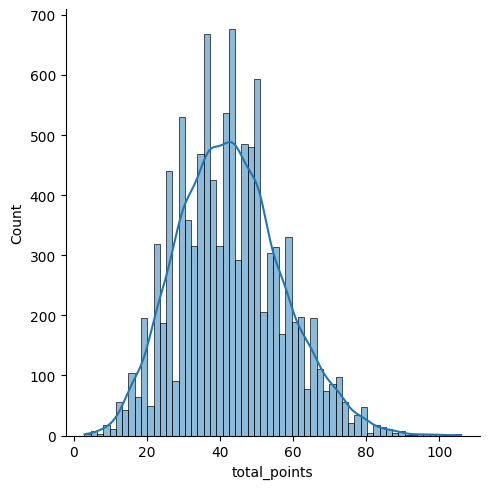

In [34]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["total_points"].describe())

#Visualizamos
sns.displot(data=scores, x="total_points", kde=True);

count    10317.000000
mean         0.574004
std          0.494517
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: result, dtype: float64


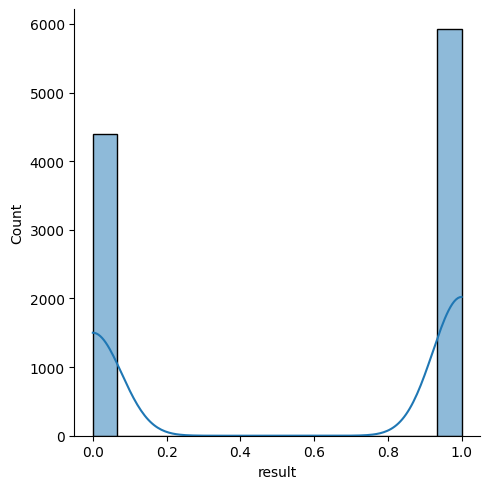

In [35]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["result"].describe())

#Visualizamos
sns.displot(data=scores, x="result", kde=True);

count    10317.000000
mean        15.966754
std          9.187027
min          0.000000
25%          8.000000
50%         16.000000
75%         24.000000
max         31.000000
Name: team_home_encoded, dtype: float64


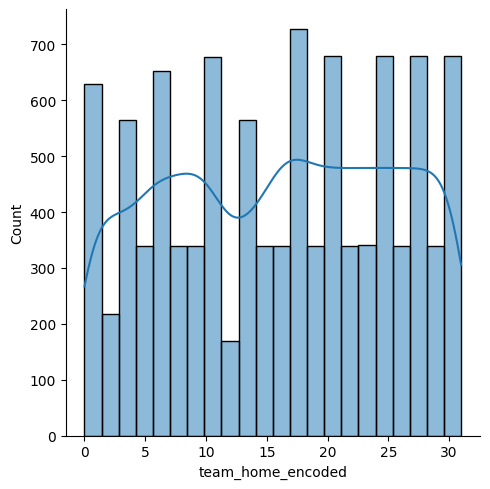

In [36]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["team_home_encoded"].describe())

#Visualizamos
sns.displot(data=scores, x="team_home_encoded", kde=True);

count    10317.000000
mean        15.957934
std          9.188811
min          0.000000
25%          8.000000
50%         16.000000
75%         24.000000
max         31.000000
Name: team_away_encoded, dtype: float64


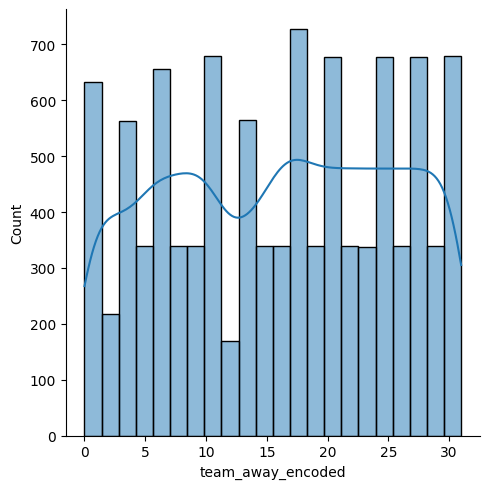

In [37]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["team_away_encoded"].describe())

#Visualizamos
sns.displot(data=scores, x="team_away_encoded", kde=True);

count    10317.000000
mean        16.640593
std          9.369082
min          0.000000
25%          9.000000
50%         17.000000
75%         25.000000
max         32.000000
Name: team_favorite_id_encoded, dtype: float64


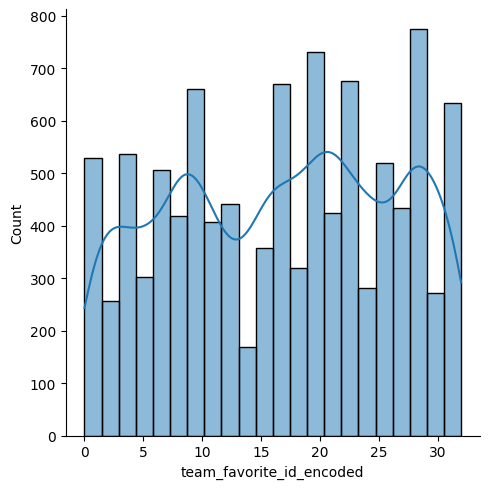

In [38]:
# Vemos la media, percentiles y máximos, mínimos, desviacion estandar, etc
print(scores["team_favorite_id_encoded"].describe())

#Visualizamos
sns.displot(data=scores, x="team_favorite_id_encoded", kde=True);

#### 4.1.2 Univariante **no** ordernado

In [39]:
# Análisis de las columnas categóricas
scores["schedule_season"].value_counts()
scores["schedule_season"].value_counts(normalize=True)

2021    0.026364
2022    0.026267
2012    0.024813
2004    0.024813
2005    0.024813
2006    0.024813
2007    0.024813
2008    0.024813
2009    0.024813
2010    0.024813
2011    0.024813
2013    0.024813
2002    0.024813
2014    0.024813
2015    0.024813
2016    0.024813
2017    0.024813
2018    0.024813
2019    0.024813
2020    0.024813
2003    0.024813
2001    0.024038
1999    0.024038
2000    0.024038
1998    0.023263
1997    0.023263
1996    0.023263
1995    0.023263
1981    0.021712
1988    0.021712
1983    0.021712
1984    0.021712
1985    0.021712
1986    0.021712
1991    0.021712
1989    0.021712
1990    0.021712
1992    0.021712
1993    0.021712
1994    0.021712
1980    0.021712
1987    0.016284
1982    0.012213
Name: schedule_season, dtype: float64

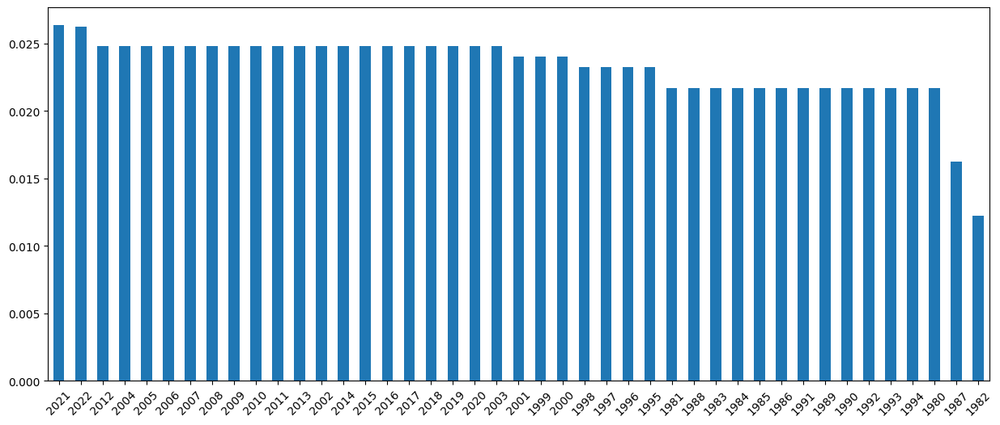

In [40]:
plt.figure(figsize=(15,6))
scores["schedule_season"].value_counts(normalize=True).head(50).plot.bar()
plt.xticks(rotation = 45);

In [41]:
# Análisis de las columnas categóricas
scores["team_home"].value_counts()
scores["team_home"].value_counts(normalize=True)

LAR    0.037608
NYG    0.033052
MIN    0.033052
PHI    0.033052
IND    0.032955
TEN    0.032955
BUF    0.032955
SEA    0.032955
SF     0.032955
LAC    0.032955
DEN    0.032955
NE     0.032858
NO     0.032858
ATL    0.032858
NYJ    0.032858
TB     0.032858
PIT    0.032858
MIA    0.032858
LVR    0.032858
KC     0.032858
GB     0.032858
DET    0.032858
DAL    0.032858
CHI    0.032858
WAS    0.032858
CIN    0.032761
CLE    0.030532
ARI    0.028206
JAX    0.021809
CAR    0.021809
BAL    0.021033
HOU    0.016381
Name: team_home, dtype: float64

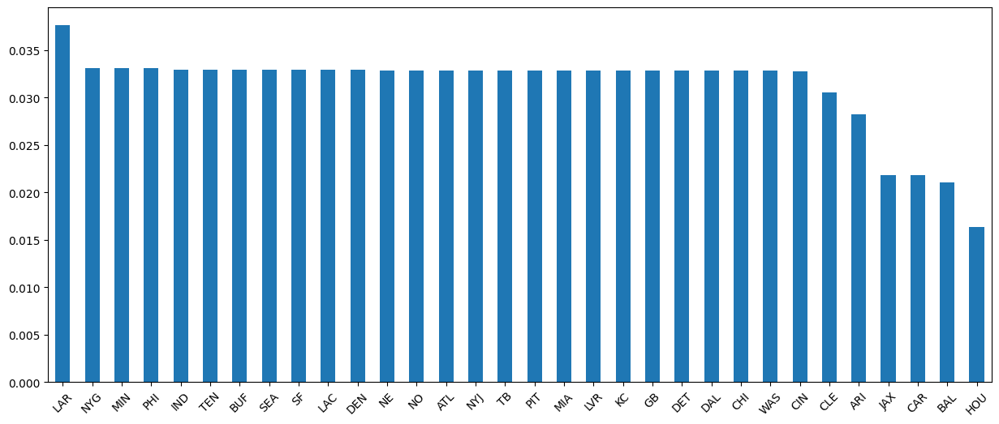

In [42]:
plt.figure(figsize=(15,6))
scores["team_home"].value_counts(normalize=True).head(50).plot.bar()
plt.xticks(rotation = 45);

In [43]:
# Análisis de las columnas categóricas
scores["team_away"].value_counts()
scores["team_away"].value_counts(normalize=True)

LAR    0.037511
ATL    0.032955
GB     0.032955
TB     0.032955
PIT    0.032955
NYJ    0.032955
NO     0.032955
NE     0.032955
LVR    0.032955
KC     0.032955
MIA    0.032955
DET    0.032955
DAL    0.032955
CIN    0.032955
CHI    0.032955
WAS    0.032955
IND    0.032858
TEN    0.032858
SEA    0.032858
SF     0.032858
LAC    0.032858
DEN    0.032858
PHI    0.032761
BUF    0.032761
NYG    0.032761
MIN    0.032761
CLE    0.030629
ARI    0.028303
JAX    0.021809
CAR    0.021809
BAL    0.021033
HOU    0.016381
Name: team_away, dtype: float64

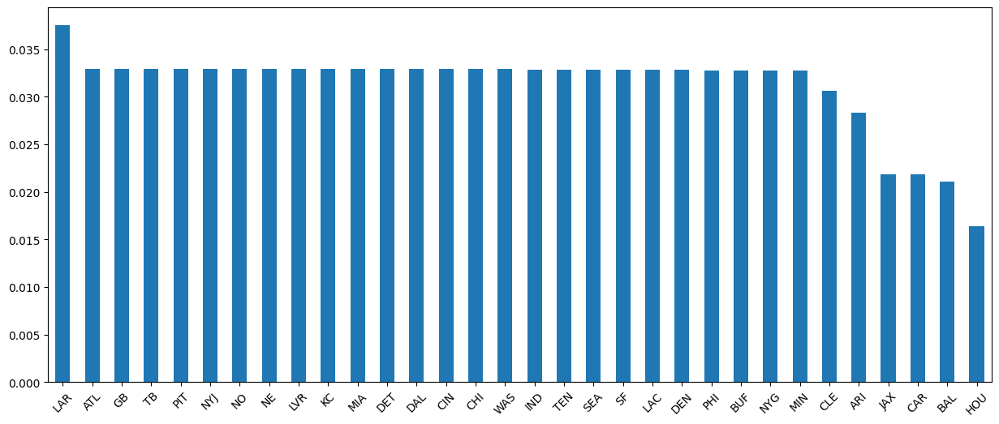

In [44]:
plt.figure(figsize=(15,6))
scores["team_away"].value_counts(normalize=True).head(50).plot.bar()
plt.xticks(rotation = 45);

In [45]:
# Análisis de las columnas categóricas
scores["team_favorite_id"].value_counts()
scores["team_favorite_id"].value_counts(normalize=True)

PIT     0.041970
SF      0.041776
NE      0.041194
DAL     0.040516
DEN     0.040225
GB      0.039353
PHI     0.037511
MIN     0.036832
KC      0.034700
MIA     0.033925
NO      0.033537
LAC     0.033343
SEA     0.033246
BUF     0.032277
NYG     0.031986
LAR     0.031598
LVR     0.030920
TEN     0.030823
IND     0.030629
WAS     0.030532
CHI     0.029369
ATL     0.029175
NYJ     0.027334
CIN     0.026849
TB      0.026364
BAL     0.024910
DET     0.023747
CLE     0.022196
ARI     0.022099
CAR     0.019773
JAX     0.016381
PICK    0.012794
HOU     0.012116
Name: team_favorite_id, dtype: float64

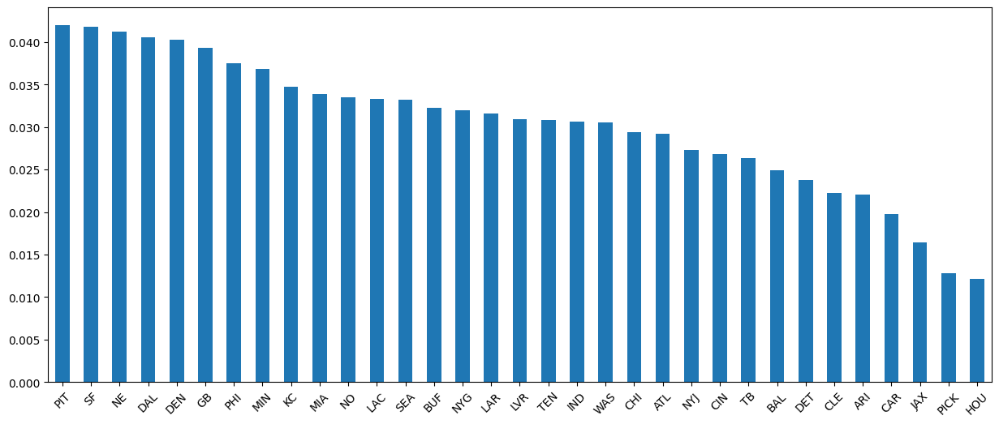

In [46]:
plt.figure(figsize=(15,6))
scores["team_favorite_id"].value_counts(normalize=True).head(50).plot.bar()
plt.xticks(rotation = 45);

In [47]:
# Análisis de las columnas categóricas
scores["stadium"].value_counts()
scores["stadium"].value_counts(normalize=True)

Giants Stadium         0.045556
Lambeau Field          0.032761
Soldier Field          0.031986
Arrowhead Stadium      0.031986
Qualcomm Stadium       0.028109
                         ...   
Tiger Stadium (LSU)    0.000388
Twickenham Stadium     0.000291
Alamo Dome             0.000291
Tottenham Stadium      0.000097
Allianz Arena          0.000097
Name: stadium, Length: 91, dtype: float64

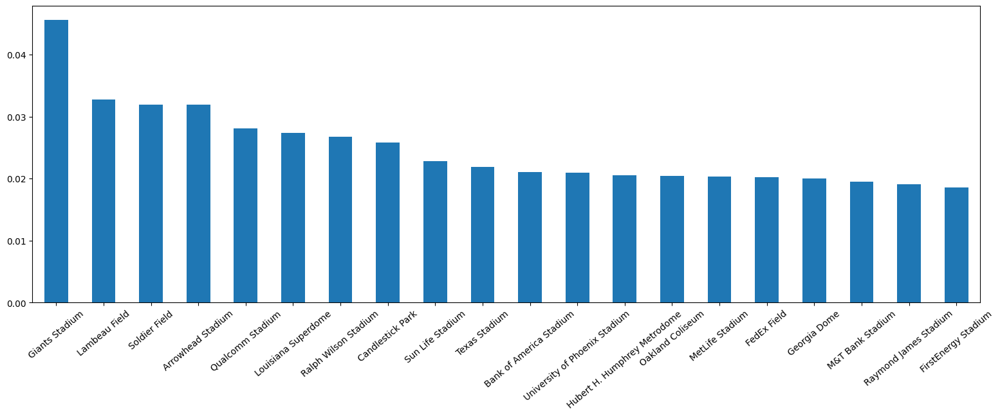

In [48]:
plt.figure(figsize=(19,6))
scores["stadium"].value_counts(normalize=True).head(20).plot.bar()
plt.xticks(rotation = 40);

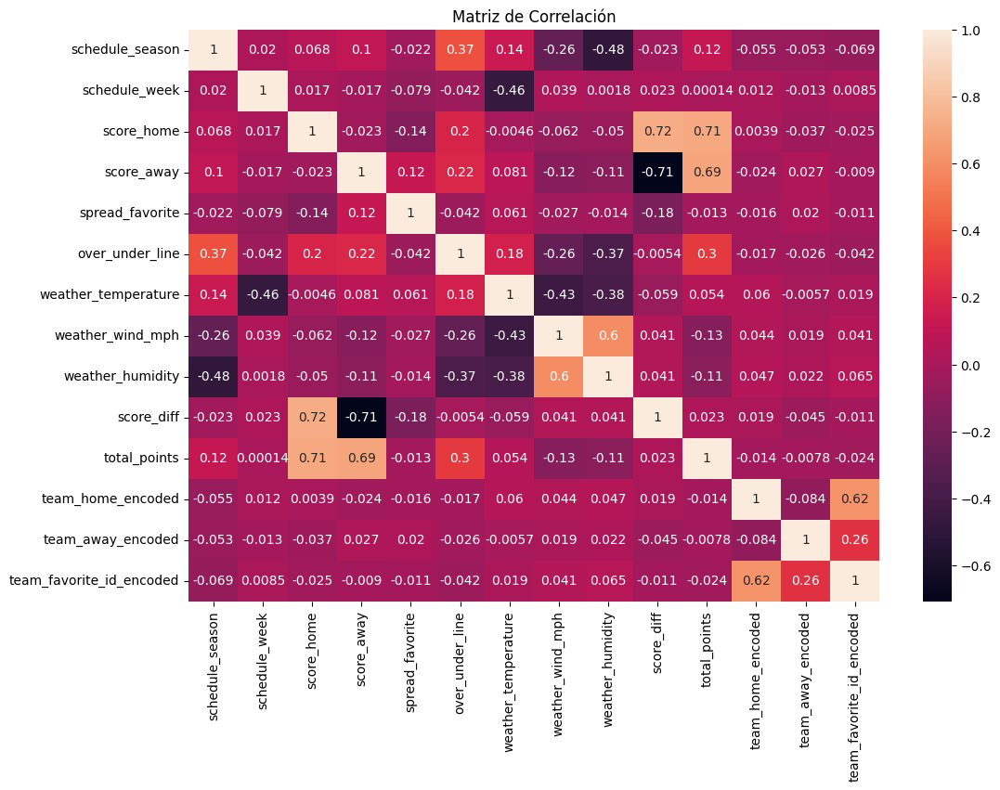

In [49]:
correlacion = scores.drop(columns=["result"])

plt.figure(figsize=(12, 8))
sns.heatmap(correlacion.corr(), annot=True)
plt.title("Matriz de Correlación");

# 5. Preparacion del modelo

In [50]:
# Nos dejamos parte de la data testear el modelo
test = scores.drop(columns=["schedule_date", 
                            "stadium", 
                            "score_home",
                            "score_away",
                            "score_diff",
                            "schedule_season",
                            "schedule_week",
                            "team_home",
                            "team_away",
                            "result",
                            "team_favorite_id",
                            "weather_wind_mph"]).loc[scores["schedule_season"] > 2021]

# test.to_csv("test_score_nfl.csv", index=False)

In [51]:
scores = scores.loc[(scores['schedule_season'] <= 2021)]

In [52]:
print(scores['result'].value_counts())

#observamos un target balancedo, no hay que tratarlo
print((scores['result'].value_counts() / len(scores['result']) * 100).map(lambda x: f"{x:.2f}%"))

1    5769
0    4277
Name: result, dtype: int64
1    57.43%
0    42.57%
Name: result, dtype: object


### 5.1 Target

- Definimos nuestra target

In [53]:
X = scores.drop(["schedule_date",
                 "stadium",
                 "score_home",
                 "score_away",
                 "score_diff",
                 "schedule_season",
                 "schedule_week", 
                 "team_home",
                 "team_away",
                 "result",
                 "team_favorite_id",
                 "weather_wind_mph",
                 ],
                axis=1
)
# X.to_csv("train_score_nfl.csv", index=False)
y = scores['result'].copy()
X.shape

(10046, 8)

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [55]:
scaler = StandardScaler()

In [56]:
scaler_X_train = scaler.fit_transform(X_train)

In [57]:
scaler_X_test = scaler.transform(X_test)

# 6. Baseline:

- Ponemos a entrenar nuestra data con todos los modelos de clasifación en crudo. Sacamos unas primeras impresiones
- Elijo la **precisión** como métrica para minimizar falsas predicciones en la NFL, tanto para **victoria local (1)** como para **victoria visitante (0)**. Busco asegurarme de que las predicciones positivas sean confiables, priorizando la exactitud para evitar errores. También, considero otras métricas para una visión completa del rendimiento del modelo.

#### 6.1 Logistic Regression

In [58]:
log_model = LogisticRegression()

In [59]:
log_model.fit(X_train,y_train)

LogisticRegression()

In [60]:
pred_lg = log_model.predict(X_test)

In [61]:
print("ROC:",roc_auc_score(y_test, pred_lg)*100)
print("Accuracy:",accuracy_score(y_test, pred_lg)*100)
print("Precision:",precision_score(y_test, pred_lg)*100)
print("F1 Score:",f1_score(y_test, pred_lg)*100)
print("Recall:",recall_score(y_test, pred_lg)*100)

ROC: 52.66896708138932
Accuracy: 57.92966157929662
Precision: 58.84615384615385
F1 Score: 70.70240295748614
Recall: 88.54166666666666


#### 6.2 Decision Tree Classifier

In [62]:
dt = DecisionTreeClassifier()

In [63]:
dt.fit(scaler_X_train,y_train)

DecisionTreeClassifier()

In [64]:
pred_dt = dt.predict(scaler_X_test)

In [65]:
print("ROC:",roc_auc_score(y_test, pred_dt)*100)
print("Accuracy:",accuracy_score(y_test, pred_dt)*100)
print("Precision:",precision_score(y_test, pred_dt)*100)
print("F1 Score:",f1_score(y_test, pred_dt)*100)
print("Recall:",recall_score(y_test, pred_dt)*100)

ROC: 55.21472337422959
Accuracy: 56.46980756469807
Precision: 61.6331096196868
F1 Score: 62.68486916951082
Recall: 63.77314814814815


#### 6.3 Random Forest

In [66]:
r_forest = RandomForestClassifier()

In [67]:
r_forest.fit(X_train, y_train)

RandomForestClassifier()

In [68]:
pred_r_forest = r_forest.predict(X_test)

In [69]:
print("ROC:",roc_auc_score(y_test, pred_r_forest)*100)
print("Accuracy:",accuracy_score(y_test, pred_r_forest)*100)
print("Precision:",precision_score(y_test, pred_r_forest)*100)
print("F1 Score:",f1_score(y_test, pred_r_forest)*100)
print("Recall:",recall_score(y_test, pred_r_forest)*100)

ROC: 59.88327825298082
Accuracy: 62.1765096217651
Precision: 64.54005934718101
F1 Score: 69.60000000000001
Recall: 75.52083333333334


#### 6.4 KNN

In [70]:
knn = KNeighborsClassifier()

In [71]:
knn.fit(scaler_X_train,y_train)

KNeighborsClassifier()

In [72]:
pred_knn = knn.predict(scaler_X_test)

In [73]:
print("ROC:",roc_auc_score(y_test, pred_knn)*100)
print("Accuracy:",accuracy_score(y_test, pred_knn)*100)
print("Precision:",precision_score(y_test, pred_knn)*100)
print("F1 Score:",f1_score(y_test, pred_knn)*100)
print("Recall:",recall_score(y_test, pred_knn)*100)

ROC: 55.25729364667934
Accuracy: 57.10019907100199
Precision: 61.39339968569932
F1 Score: 64.4487214737421
Recall: 67.82407407407408


#### 6.5 SVM

In [74]:
svm = SVC()

In [75]:
svm.fit(scaler_X_train,y_train)

SVC()

In [76]:
pred_svm = svm.predict(scaler_X_test)

In [77]:
print("ROC:",roc_auc_score(y_test, pred_svm)*100)
print("Accuracy:",accuracy_score(y_test, pred_svm)*100)
print("Precision:",precision_score(y_test, pred_svm)*100)
print("F1 Score:",f1_score(y_test, pred_svm)*100)
print("Recall:",recall_score(y_test, pred_svm)*100)

ROC: 57.44489264731294
Accuracy: 61.87790311877903
Precision: 61.811505507955935
F1 Score: 72.50538406317301
Recall: 87.67361111111111


#### 6.6 GaussianNB

In [78]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

In [79]:
gnb.fit(X_train, y_train)

GaussianNB()

In [80]:
pred_gnb = gnb.predict(X_test)

In [81]:
print("ROC:",roc_auc_score(y_test, pred_gnb)*100)
print("Accuracy:",accuracy_score(y_test, pred_gnb)*100)
print("Precision:",precision_score(y_test, pred_gnb)*100)
print("F1 Score:",f1_score(y_test, pred_gnb)*100)
print("Recall:",recall_score(y_test, pred_gnb)*100)

ROC: 53.324261275272164
Accuracy: 56.50298606502986
Precision: 59.586206896551715
F1 Score: 66.41045349730976
Recall: 75.0


#### 6.7 XGBoost

In [82]:
import xgboost as xgb
xgb = xgb.XGBClassifier(learning_rate=0.1, n_estimators=100, max_depth=3, subsample=0.8, colsample_bytree= 0.9, gamma=5)

In [83]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=5, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [84]:
pred_xgb = xgb.predict(X_test)

In [85]:
print("ROC:",roc_auc_score(y_test, pred_xgb)*100)
print("Accuracy:",accuracy_score(y_test, pred_xgb)*100)
print("Precision:",precision_score(y_test, pred_xgb)*100)
print("F1 Score:",f1_score(y_test, pred_xgb)*100)
print("Recall:",recall_score(y_test, pred_xgb)*100)

ROC: 60.09581461321353
Accuracy: 62.77372262773723
Precision: 64.41484300666033
F1 Score: 70.70496083550914
Recall: 78.35648148148148


#### 6.8 CatBoost

In [86]:
cat = CatBoostClassifier()

In [87]:
cat.fit(X_train, y_train)

Learning rate set to 0.023694
0:	learn: 0.6919479	total: 69.5ms	remaining: 1m 9s
1:	learn: 0.6909312	total: 71.3ms	remaining: 35.6s
2:	learn: 0.6885785	total: 73.2ms	remaining: 24.3s
3:	learn: 0.6864293	total: 75.1ms	remaining: 18.7s
4:	learn: 0.6846996	total: 77ms	remaining: 15.3s
5:	learn: 0.6828150	total: 79.3ms	remaining: 13.1s
6:	learn: 0.6808781	total: 81.5ms	remaining: 11.6s
7:	learn: 0.6789141	total: 84ms	remaining: 10.4s


8:	learn: 0.6773721	total: 87.1ms	remaining: 9.6s
9:	learn: 0.6767026	total: 90.3ms	remaining: 8.94s
10:	learn: 0.6747372	total: 93ms	remaining: 8.36s
11:	learn: 0.6732230	total: 95.2ms	remaining: 7.84s
12:	learn: 0.6719580	total: 97.1ms	remaining: 7.37s
13:	learn: 0.6710001	total: 99.8ms	remaining: 7.03s
14:	learn: 0.6695648	total: 102ms	remaining: 6.72s
15:	learn: 0.6684661	total: 106ms	remaining: 6.5s
16:	learn: 0.6672037	total: 108ms	remaining: 6.25s
17:	learn: 0.6657809	total: 111ms	remaining: 6.04s
18:	learn: 0.6646194	total: 113ms	remaining: 5.85s
19:	learn: 0.6635686	total: 117ms	remaining: 5.73s
20:	learn: 0.6624114	total: 119ms	remaining: 5.54s
21:	learn: 0.6609943	total: 121ms	remaining: 5.38s
22:	learn: 0.6598665	total: 125ms	remaining: 5.3s
23:	learn: 0.6592062	total: 129ms	remaining: 5.23s
24:	learn: 0.6584301	total: 130ms	remaining: 5.09s
25:	learn: 0.6578026	total: 132ms	remaining: 4.94s
26:	learn: 0.6568177	total: 133ms	remaining: 4.81s
27:	learn: 0.6563192	total: 135m

In [88]:
pred_cat = cat.predict(X_test)

In [89]:
print("ROC:",roc_auc_score(y_test, pred_cat)*100)
print("Accuracy:",accuracy_score(y_test, pred_cat)*100)
print("Precision:",precision_score(y_test, pred_cat)*100)
print("F1 Score:",f1_score(y_test, pred_cat)*100)
print("Recall:",recall_score(y_test, pred_cat)*100)

ROC: 60.265780700996494
Accuracy: 62.74054412740544
Precision: 64.67734109655507
F1 Score: 70.36157297439959
Recall: 77.14120370370371


#### 6.9 Gradient Boosting

In [90]:
gbc = GradientBoostingClassifier()

In [91]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier()

In [92]:
pred_gbc = gbc.predict(X_test)

In [93]:
print("ROC:",roc_auc_score(y_test, pred_gbc)*100)
print("Accuracy:",accuracy_score(y_test, pred_gbc)*100)
print("Precision:",precision_score(y_test, pred_gbc)*100)
print("F1 Score:",f1_score(y_test, pred_gbc)*100)
print("Recall:",recall_score(y_test, pred_gbc)*100)

ROC: 60.392411511433664
Accuracy: 63.205043132050434
Precision: 64.52369779446269
F1 Score: 71.26198497019953
Recall: 79.57175925925925


- Lo optimizamos todo el baseline a un solo snippet. Para tener una visión más completa. 

- Obtamos por quedarnos con el balanceado ya nos otorga una mejor performance

In [94]:
# Balanceamos con un SMOTE
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

In [95]:
import xgboost as xgb

models_balanced = {
    "Random Forest": RandomForestClassifier(),
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "XGBoost": xgb.XGBClassifier(),
    "LightGBM": lgb.LGBMClassifier(),
    "CatBoost": CatBoostClassifier(),
    "KNN": KNeighborsClassifier()
}
results = []

for model_name, model in models_balanced.items():
    if model_name in ["Gradient Boosting", "XGBoost", "LightGBM", "CatBoost"]:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_balanced)
        X_test_scaled = scaler.transform(X_test)
        model.fit(X_train_scaled, y_train_balanced)
        y_pred = model.predict(X_test_scaled)
    else:
        model.fit(X_train_balanced, y_train_balanced)
        y_pred = model.predict(X_test)
        
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    
    results.append((model_name, precision, recall, accuracy))
models_balanced = pd.DataFrame(results, columns=["Model", "Precision", "Recall", "Accuracy"])

Learning rate set to 0.025145
0:	learn: 0.6921976	total: 1.86ms	remaining: 1.85s
1:	learn: 0.6913288	total: 3.46ms	remaining: 1.73s
2:	learn: 0.6894237	total: 5.44ms	remaining: 1.81s
3:	learn: 0.6873982	total: 7.18ms	remaining: 1.79s
4:	learn: 0.6854915	total: 10.4ms	remaining: 2.07s
5:	learn: 0.6847847	total: 12.3ms	remaining: 2.04s
6:	learn: 0.6830768	total: 14.5ms	remaining: 2.05s
7:	learn: 0.6817419	total: 16.9ms	remaining: 2.1s
8:	learn: 0.6803060	total: 18.9ms	remaining: 2.08s
9:	learn: 0.6794571	total: 21.1ms	remaining: 2.09s
10:	learn: 0.6776351	total: 23.6ms	remaining: 2.12s
11:	learn: 0.6760579	total: 36.2ms	remaining: 2.98s
12:	learn: 0.6749590	total: 37.9ms	remaining: 2.88s
13:	learn: 0.6739697	total: 40ms	remaining: 2.82s
14:	learn: 0.6731165	total: 42ms	remaining: 2.76s
15:	learn: 0.6720348	total: 43.9ms	remaining: 2.7s
16:	learn: 0.6708962	total: 45.8ms	remaining: 2.65s
17:	learn: 0.6702846	total: 58.7ms	remaining: 3.2s
18:	learn: 0.6694986	total: 61.3ms	remaining: 3.16s

In [96]:
models_balanced.sort_values(by="Precision", ascending=False)

,Model,Precision,Recall,Accuracy
2,SVM,0.697404,0.450810,0.572993
3,Gradient Boosting,0.674729,0.613426,0.608825
6,CatBoost,0.665767,0.713542,0.630392
5,LightGBM,0.658242,0.693287,0.617784
0,Random Forest,0.652746,0.660301,0.603849
4,XGBoost,0.647122,0.696181,0.608162
1,Logistic Regression,0.642965,0.491898,0.552090
7,KNN,0.621936,0.587384,0.558726


# 7. Crossvalidation

- Descartamos el SVM y elegimos los otros 4 debido a su mejor rendimiento en datos no lineales y facilidad en la optimización de hiperparámetros. Son más efectivos para clasificación

In [97]:
svm_model = SVC()
gradient_boosting_model = GradientBoostingClassifier()
lightgbm_model = lgb.LGBMClassifier()
catboost_model = CatBoostClassifier()
xgboost_model = xgb.XGBClassifier()

models = [svm_model, gradient_boosting_model, lightgbm_model, catboost_model, xgboost_model]

model_names = ['SVM', 'Gradient Boosting', 'LightGBM', 'CatBoost', 'XGBoost']

precision_scores = []
accuracy_scores = []
recall_scores = []
for model in models:

    precision_scores.append(cross_val_score(model, X_train_balanced, y_train_balanced, cv=10, scoring='precision').mean())
    accuracy_scores.append(cross_val_score(model, X_train_balanced, y_train_balanced, cv=10, scoring='accuracy').mean())
    recall_scores.append(cross_val_score(model, X_train_balanced, y_train_balanced, cv=10, scoring='recall').mean())

results_cv = pd.DataFrame({'Model': model_names, 'Precision': precision_scores, 'Accuracy': accuracy_scores, 'Recall': recall_scores})
results_cv.sort_values(by="Precision", ascending=False)


Learning rate set to 0.024037
0:	learn: 0.6922471	total: 2.08ms	remaining: 2.08s
1:	learn: 0.6915394	total: 3.61ms	remaining: 1.8s
2:	learn: 0.6896384	total: 6.84ms	remaining: 2.27s
3:	learn: 0.6876327	total: 8.79ms	remaining: 2.19s
4:	learn: 0.6862431	total: 11.6ms	remaining: 2.31s
5:	learn: 0.6855266	total: 13.7ms	remaining: 2.26s
6:	learn: 0.6836820	total: 15.4ms	remaining: 2.19s
7:	learn: 0.6828832	total: 18.9ms	remaining: 2.34s
8:	learn: 0.6815762	total: 20.9ms	remaining: 2.3s
9:	learn: 0.6797693	total: 22.7ms	remaining: 2.24s
10:	learn: 0.6779630	total: 24.6ms	remaining: 2.21s
11:	learn: 0.6766160	total: 26.6ms	remaining: 2.19s
12:	learn: 0.6755467	total: 28.6ms	remaining: 2.17s
13:	learn: 0.6745704	total: 30.9ms	remaining: 2.17s
14:	learn: 0.6735914	total: 32.8ms	remaining: 2.15s
15:	learn: 0.6725794	total: 35.2ms	remaining: 2.16s
16:	learn: 0.6712833	total: 37.4ms	remaining: 2.16s
17:	learn: 0.6707362	total: 39.4ms	remaining: 2.15s
18:	learn: 0.6696642	total: 41.2ms	remaining: 

,Model,Precision,Accuracy,Recall
3,CatBoost,0.670803,0.659499,0.694139
4,XGBoost,0.667955,0.648369,0.681519
2,LightGBM,0.655230,0.645642,0.679290
1,Gradient Boosting,0.644864,0.631656,0.608264
0,SVM,0.627542,0.588591,0.438012


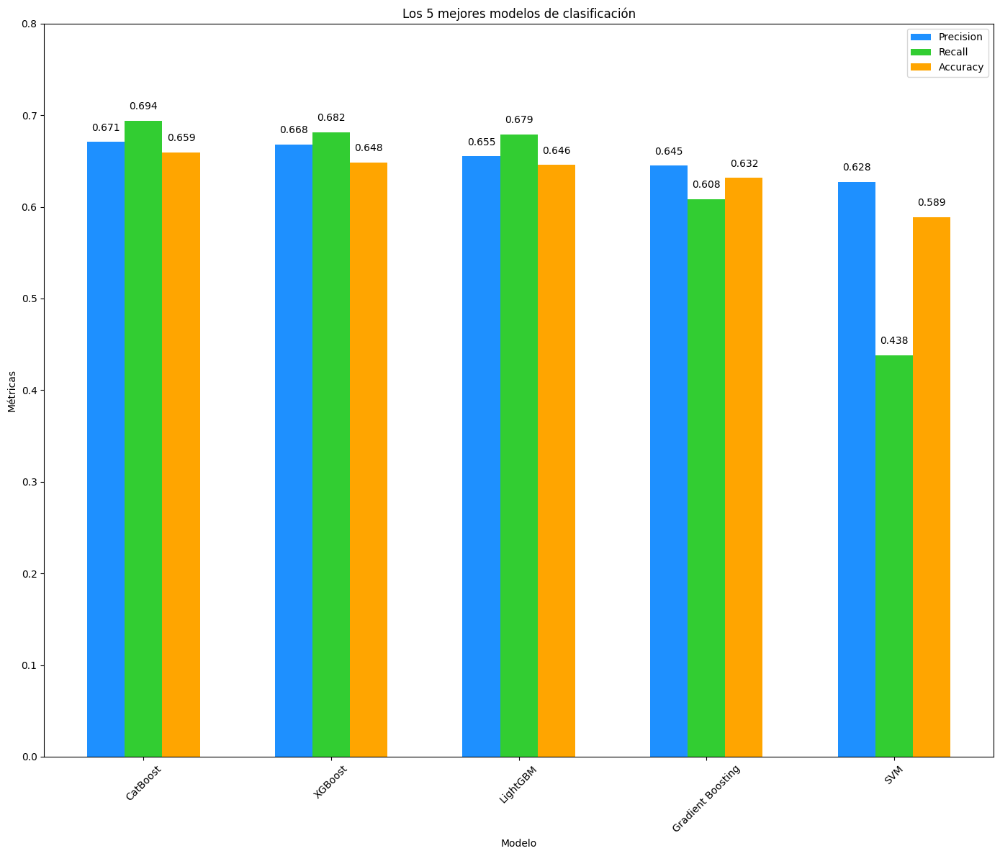

In [98]:

models_balanced_sorted = results_cv.sort_values(by="Precision", ascending=False)
top_5_models = models_balanced_sorted.head(5)

plt.figure(figsize=(14, 12))

models = top_5_models["Model"]
precision_scores = top_5_models["Precision"]
recall_scores = top_5_models["Recall"]
accuracy_scores = top_5_models["Accuracy"]

x = np.arange(len(models))

width = 0.2

plt.bar(x - width, precision_scores, width, label='Precision', color='dodgerblue')
plt.bar(x, recall_scores, width, label='Recall', color='limegreen')
plt.bar(x + width, accuracy_scores, width, label='Accuracy', color='orange')

plt.xlabel('Modelo')
plt.ylabel('Métricas')
plt.title('Los 5 mejores modelos de clasificación')
plt.xticks(x, models, rotation=45)
plt.legend()

for i, v in enumerate(precision_scores):
    plt.text(i - width, v + 0.01, f'{v:.3f}', color='black', ha='center', va='bottom')
    
for i, v in enumerate(recall_scores):
    plt.text(i, v + 0.01, f'{v:.3f}', color='black', ha='center', va='bottom')
    
for i, v in enumerate(accuracy_scores):
    plt.text(i + width, v + 0.01, f'{v:.3f}', color='black', ha='center', va='bottom')

plt.ylim(0, 0.8)
plt.tight_layout();


# 8. GridSearch

- Nos quedaremos con los 3 modelos para proceder a hacerle un GridSearch

In [99]:
top_3_models = [CatBoostClassifier(), xgb.XGBClassifier(), lgb.LGBMClassifier()]
top_3_model_names = ['CatBoost', 'XGBoost', 'LightGBM']

# Lista de parámetros para la cuadrícula de búsqueda para cada modelo
param_grid_catboost = {
    'learning_rate': [0.1, 0.01, 0.5, 1],
    'depth': [4, 6, 8, 10, 20],
    'iterations': [100, 200, 300, 500, 1000]
}

param_grid_xgboost = {
    'learning_rate': [0.1, 0.01],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200]
}

param_grid_lightgbm = {
    'learning_rate': [0.1, 0.01],
    'num_leaves': [30, 50, 100],
    'n_estimators': [100, 200]
}

param_grids = [param_grid_catboost, param_grid_xgboost, param_grid_lightgbm]
best_models_with_params = []
precision_scores = []

for i, model in enumerate(top_3_models):
    grid_search = GridSearchCV(model, param_grids[i], cv=5, scoring='precision')
    grid_search.fit(X_train_balanced, y_train_balanced)
    best_models_with_params.append((grid_search.best_estimator_, top_3_model_names[i], grid_search.best_params_))
    precision_scores.append(grid_search.best_score_)

for i, (model, model_name, best_params) in enumerate(best_models_with_params):
    print(f"Mejor modelo ({model_name}) con hiperparámetros:")
    print(best_params)
    print("Precisión promedio en validación cruzada:", precision_scores[i])
    print("-----------------------------------------------")

best_model = top_3_models[np.argmax(precision_scores)]
best_model.fit(X_train_balanced, y_train_balanced)
y_pred = best_model.predict(X_test)
precision_test = precision_score(y_test, y_pred)
print(f"Precisión en el conjunto de prueba del mejor modelo ({top_3_model_names[np.argmax(precision_scores)]}):", precision_test)


0:	learn: 0.6899220	total: 851us	remaining: 84.3ms
1:	learn: 0.6874688	total: 1.97ms	remaining: 96.5ms
2:	learn: 0.6853371	total: 2.59ms	remaining: 83.8ms
3:	learn: 0.6837814	total: 3.21ms	remaining: 77ms
4:	learn: 0.6814842	total: 7.39ms	remaining: 140ms
5:	learn: 0.6802017	total: 8.01ms	remaining: 126ms
6:	learn: 0.6788091	total: 8.66ms	remaining: 115ms
7:	learn: 0.6775945	total: 9.28ms	remaining: 107ms
8:	learn: 0.6747582	total: 9.86ms	remaining: 99.7ms
9:	learn: 0.6715550	total: 10.5ms	remaining: 94.5ms
10:	learn: 0.6709129	total: 11.1ms	remaining: 89.9ms
11:	learn: 0.6672889	total: 11.8ms	remaining: 86.2ms
12:	learn: 0.6645242	total: 14.5ms	remaining: 97.2ms
13:	learn: 0.6622866	total: 15.2ms	remaining: 93.2ms
14:	learn: 0.6619069	total: 15.8ms	remaining: 89.4ms
15:	learn: 0.6602350	total: 16.4ms	remaining: 86.2ms
16:	learn: 0.6595325	total: 17.1ms	remaining: 83.3ms
17:	learn: 0.6590799	total: 17.7ms	remaining: 80.7ms
18:	learn: 0.6586464	total: 18.3ms	remaining: 78.1ms
19:	learn:

In [100]:
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.metrics import precision_score
# from sklearn.model_selection import RepeatedStratifiedKFold

# # Lista de modelos y nombres de modelos a evaluar (CatBoost y XGBoost)
# top_2_models = [CatBoostClassifier(), xgb.XGBClassifier()]
# top_2_model_names = ['CatBoost', 'XGBoost']

# # Lista de parámetros para la cuadrícula de búsqueda para cada modelo
# param_grid_catboost = {
#     'learning_rate': [0.01, 0.1, 0.5],
#     'depth': [4, 6, 8, 10],
#     'iterations': [100, 200, 300]
# }

# param_grid_xgboost = {
#     'learning_rate': [0.01, 0.1, 0.5],
#     'max_depth': [3, 5, 7],
#     'n_estimators': [100, 200, 300]
# }

# param_grids = [param_grid_catboost, param_grid_xgboost]
# best_models_with_params = []
# precision_scores = []

# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=42)

# for i, model in enumerate(top_2_models):
#     randomized_search = RandomizedSearchCV(model, param_grids[i], n_iter=50, cv=cv, scoring='precision', random_state=42)
#     randomized_search.fit(X_train_balanced, y_train_balanced)
#     best_models_with_params.append((randomized_search.best_estimator_, top_2_model_names[i], randomized_search.best_params_))
#     precision_scores.append(randomized_search.best_score_)

# for i, (model, model_name, best_params) in enumerate(best_models_with_params):
#     print(f"Mejor modelo ({model_name}) con hiperparámetros:")
#     print(best_params)
#     print("Precisión promedio en validación cruzada:", precision_scores[i])
#     print("-----------------------------------------------")

# # Seleccionar el mejor modelo basado en la validación cruzada
# best_model = top_2_models[np.argmax(precision_scores)]

# # Ajustar el mejor modelo en los datos de entrenamiento balanceados
# best_model.fit(X_train_balanced, y_train_balanced)

# # Predecir en el conjunto de prueba
# y_pred = best_model.predict(X_test)

# # Calcular la precisión en el conjunto de prueba del mejor modelo seleccionado
# precision_test = precision_score(y_test, y_pred)

# # Mostrar la precisión en el conjunto de prueba del mejor modelo
# print(f"Precisión en el conjunto de prueba del mejor modelo ({top_2_model_names[np.argmax(precision_scores)]}):", precision_test)


## 10. Modelo final

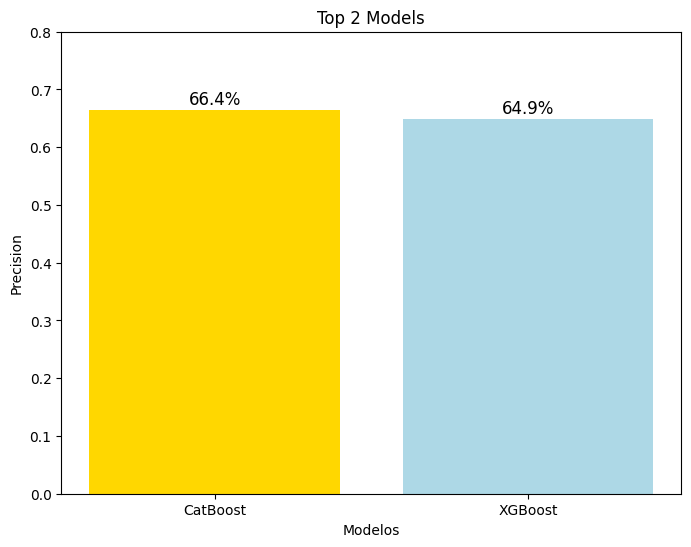

In [117]:
labels = top_3_model_names[:2]
sizes = precision_scores[:2]
colors = ['gold', 'lightblue']

plt.figure(figsize=(8, 6))
plt.bar(labels, sizes, color=colors)
plt.xlabel("Modelos")
plt.ylabel("Precision")
plt.title("Top 2 Models")
plt.ylim(0, 0.8)

# Agregar etiquetas con los valores de precisión en cada barra
for i, v in enumerate(sizes):
    plt.text(i, v + 0.01, f"{v:.1%}", color='black', ha='center', fontsize=12)

plt.show()

# Obtener el mejor modelo y sus detalles
best_model_index = np.argmax(precision_scores[:2])
best_model_name = top_3_model_names[best_model_index]
best_model_object = best_models_with_params[best_model_index][0]


In [118]:
#Guardando el mejor modelo
filename = "model.pkl"
with open(filename, 'wb') as file:
    pickle.dump(best_model_object, file)
print(f"Best model ({best_model_name}) has been saved to {filename}.")

Best model (CatBoost) has been saved to model.pkl.


# 11. Conclusiones

##### Después de ir filtrando gradualmente todos los modelos de clasificación, el que mejor ha respondido en la validación cruzada y con los hiperparámetros ajustados, dando el mejor resultado con un porcentaje del 66,7%, es el CatBoost. Por lo tanto, este es el modelo elegido con el que trabajaré.


### 11.1 Resumen

Se realizó un proceso de filtrado y evaluación de varios modelos de clasificación, y el que mejor respondió en la validación cruzada y los hiperparámetros fue el CatBoost, obteniendo un resultado del 67% de precision score. Se decidió utilizar este modelo para implementarlo en una API para un cliente, quien busca obtener buenos resultados para su promoción en su empresa SIKER-BET. Sin embargo, se menciona que la data no ha respondido tan bien como se esperaba a las predicciones, lo cual es comprensible debido a que los resultados en la predicción de deportes suelen ser difíciles de superar el 80%. A pesar de esto, se tomó la decisión de no seguir ajustando los hiperparámetros y quedarse con el modelo CatBoost como base para la implementación en la API.

## <a href ='#0'> 🔝 To the moon 🔝 </a>